# Семинар 3: Калибровка камеры

## План семинара

| Блок | Основной вопрос |
|:--|:--|
| 1. Геометрическая модель камеры | Как 3D-точка превращается в точку изображения? | 
| 2. Системы координат и переход от мировых координат к пикселям | Как связаны мир, камера, изображение и пиксели? |
| 3. Постановка задачи калибровки и оценка параметров камеры по 3D калибровочному датасету | Как найти камеру по соответствиям 3D–2D? |
| 4. Решение задачи калибровки по 2D калибровочному датасету | Почему одной доски достаточно? |
| 5. Практическая часть | Калибровка камеры плоским паттерном |
| 6. Разбор практического применения калибровки | Где использовать полученные параметры камеры? |

Источники: 

1) Computer Vision: Algorithms and Applications (Richard Szeliski)
2) Multiple View Geometry in Computer Vision (Richard Hartley, Andrew Zisserman)
3) Официальный туториал OpenCV по калибровке: https://docs.opencv.org/4.12.0/dc/dbb/tutorial_py_calibration.html
4) Лекции Columbia University https://fpcv.cs.columbia.edu/

# 1. Модель камеры

## 1.1. Pinhole-модель

В модели **pinhole camera** все лучи проходят через один центр проекции $C$. Точка пространства и её изображение лежат на одной прямой с $C$.

Физический экран (плоскость изображения) расположен за отверстием, поэтому изображение перевёрнуто.

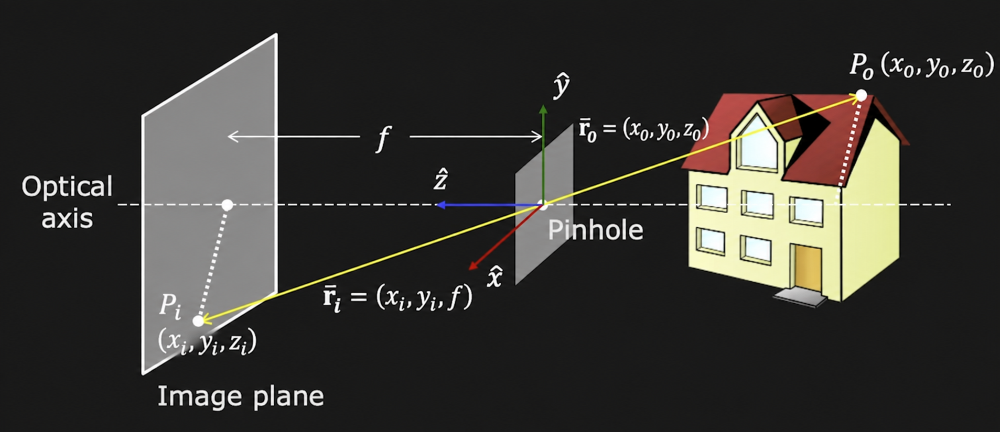

Для любой точки $P_i$ на плоскости изображения её $z$-координата равна фокусному расстоянию:

$$
z_i=f.
$$

Здесь имеет место подобие треугольников по двум углам: вертикальные углы равны, а оба треугольника прямоугольные.

Из подобия получаем **уравнения перспективного преобразования**. В векторной форме:

$$
\frac{\mathbf r_i}{f}=\frac{\mathbf r_0}{Z_0}.
$$

Для отдельных координат:

$$
\frac{x_i}{f}=\frac{X_0}{Z_0},
\qquad
\frac{y_i}{f}=\frac{Y_0}{Z_0}.
$$

Отсюда:

$$
\boxed{
x_i=f\frac{X_0}{Z_0},
\qquad
y_i=f\frac{Y_0}{Z_0}.
}
$$

Здесь $(X_0,Y_0,Z_0)$ — координаты точки объекта в системе координат камеры, а $(x_i,y_i)$ — координаты её проекции на плоскости изображения.

Из подобия треугольников для виртуальной плоскости $Z_c=f$:

$$
\frac{x_m}{f}=\frac{X_c}{Z_c},\qquad
\frac{y_m}{f}=\frac{Y_c}{Z_c}.
$$

Отсюда **уравнения перспективного преобразования**:

$$
\boxed{x_m=f\frac{X_c}{Z_c},\qquad y_m=f\frac{Y_c}{Z_c}.}
$$

## 1.2. Линейное увеличение изображения

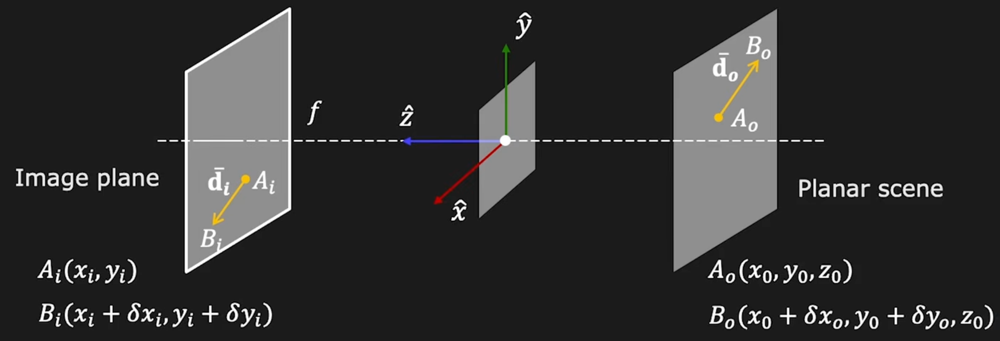

Линейное увеличение изображения:

$$
m = \frac{\|d_i\|}{\|d_0\|}
$$

$$
\boxed{m=\frac{\sqrt{\Delta x_i^2+\Delta y_i^2}}
{\sqrt{\Delta x_0^2+\Delta y_0^2}}=\left|\frac{f}{Z_0}\right|.}
$$

Линейное увеличение обратно пропорционально расстоянию от объекта до камеры - то есть, чем больше глубина $|Z_0|$, тем меньше изображение объекта одинакового физического размера.

## 1.3. Зачем реальной камере объектив

Маленькое отверстие пропускает мало света. Слишком большое отверстие даёт размытие: от одной точки сцены на сенсор приходит не один узкий пучок. Объектив собирает больше света и фокусирует его.

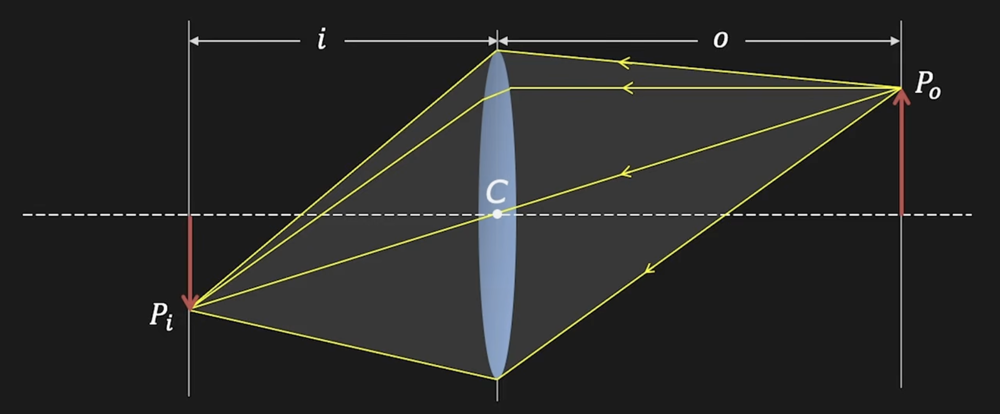

Способность линзы преломлять свет характеризуется ее фокусным расстоянием $f$, где $f$ - это расстояние от линзы до фокуса. Фокус - точка на оптической оси, в которой после прохождения через собирающую линзу пересекаются лучи, которые до линзы шли параллельно оптической оси.

Для тонкой линзы:

$$
\frac{1}{d_o}+\frac{1}{d_i}=\frac{1}{f_{\mathrm{lens}}},\qquad
|\mu|=\frac{d_i}{d_o},
$$

где $d_o$ — расстояние от объекта до линзы, $d_i$ — расстояние до резкого изображения, $f_{\mathrm{lens}}$ — фокусное расстояние линзы.

# 2. Системы координат и переход от мировых координат к пикселям

### Переход World → Camera → Image → Pixels

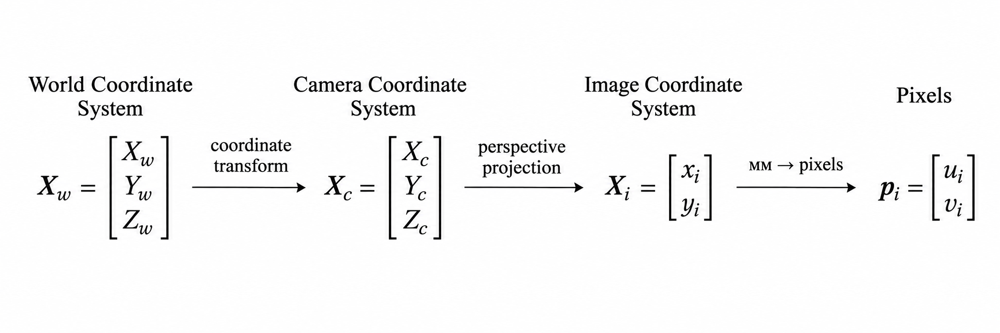

## 2.1. Image CS $\rightarrow$ Pixels

### 1. Перспективная проекция

Перспективную проекцию (*perspective projection*) мы уже вывели, когда работали в системе координат камеры (pinhole-модель):

$$
\boxed{x_i=f\frac{X_c}{Z_c},\qquad y_i=f\frac{Y_c}{Z_c}.}
$$

Далее для краткости обозначим координаты изображения как $x=x_i$, $y=y_i$.

### 2. Система координат изображения и пиксельная система координат

СК изображения и пиксельная СК описывают одну и ту же плоскость, но отличаются началом координат и единицами измерения: миллиметрами и пикселями. Направления соответствующих осей считаем совпадающими.

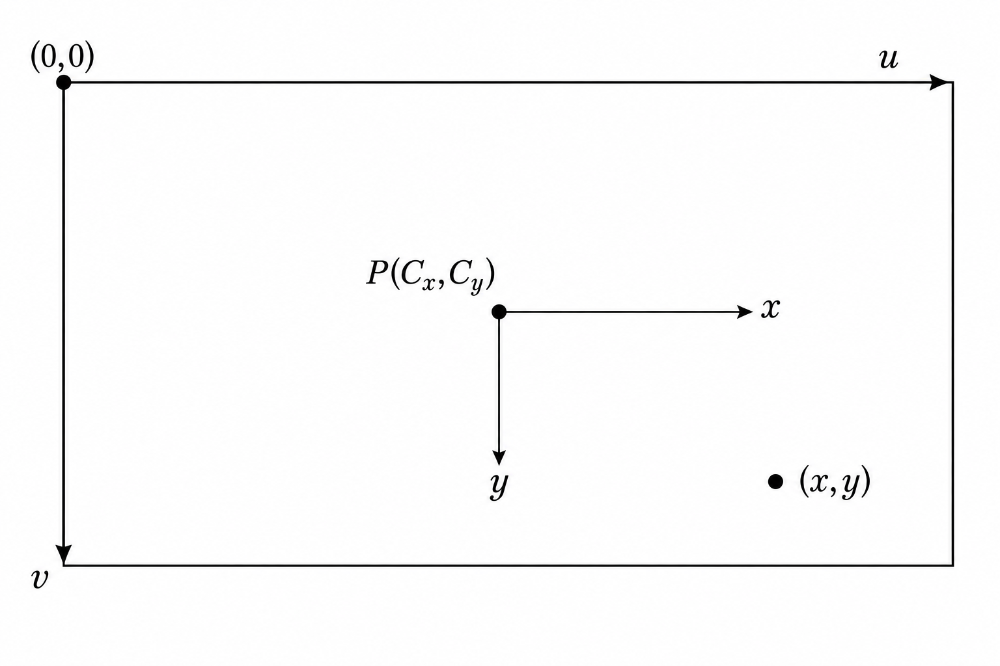

Точка $P$ здесь — **главная точка** (*principal point*): пересечение оптической оси с плоскостью изображения. В метрических координатах это $(0,0)$, а в пиксельных — $(c_x,c_y)$.

### 3. Размер пикселя и перевод миллиметров в пиксели

Сенсор состоит из пикселей. Введём размер одного пикселя по каждой оси:

$$
p_x\;\left[\frac{\mathrm{mm}}{\mathrm{px}}\right],
\qquad
p_y\;\left[\frac{\mathrm{mm}}{\mathrm{px}}\right].
$$

Сначала переведём смещения относительно главной точки из миллиметров в пиксели:

$$
\Delta u=\frac{x}{p_x},\qquad
\Delta v=\frac{y}{p_y}.
$$

Например:

$$
p_x=0.005\;\frac{\text{мм}}{\text{пиксель}},
\qquad
x=1\;\text{мм}.
$$

Тогда:

$$
\Delta u=\frac{1}{0.005}=200\;\text{пикселей}.
$$

То есть отрезку длиной 1 мм по горизонтальной оси соответствует 200 пикселей.

### 4. Учёт положения главной точки

Теперь учтём различие начал координат: добавим пиксельные координаты главной точки $(c_x,c_y)$.

$$
u=\frac{x}{p_x}+c_x,\qquad
v=\frac{y}{p_y}+c_y.
$$

### 5. Масштабные коэффициенты

Введём масштабные коэффициенты:

$$
s_x=\frac{1}{p_x},\qquad
s_y=\frac{1}{p_y}.
$$

Тогда:

$$
u=s_x x+c_x,\qquad
v=s_y y+c_y.
$$

### 6. Объединение с перспективной проекцией

Добавим переход из системы координат камеры на плоскость изображения
(*perspective projection*):

$$
x=f\frac{X_c}{Z_c},\qquad
y=f\frac{Y_c}{Z_c}.
$$

Получаем:

$$
\boxed{
u=s_x f\frac{X_c}{Z_c}+c_x,\qquad
v=s_y f\frac{Y_c}{Z_c}+c_y.
}
$$

Обозначим фокусные расстояния в пикселях:

$$
f_x=s_x f=\frac{f}{p_x},\qquad
f_y=s_y f=\frac{f}{p_y}.
$$

### 7. Матричная запись и внутренние параметры камеры

Запишем всё в матричном виде. Сначала умножим оба уравнения на $Z_c$:

$$
uZ_c=f_xX_c+c_xZ_c,
\qquad
vZ_c=f_yY_c+c_yZ_c.
$$

Тогда:

$$
\begin{bmatrix}
uZ_c\\
vZ_c\\
Z_c
\end{bmatrix} =
\underbrace{
\begin{bmatrix}
f_x & 0 & c_x\\
0 & f_y & c_y\\
0 & 0 & 1
\end{bmatrix}
}_{K}
\begin{bmatrix}
X_c\\
Y_c\\
Z_c
\end{bmatrix}.
$$

Или, вынося $Z_c$ за скобки:

$$
\boxed{
Z_c
\begin{bmatrix}
u\\
v\\
1
\end{bmatrix} = K
\begin{bmatrix}
X_c\\
Y_c\\
Z_c
\end{bmatrix}.
}
$$

Матрица $K$ содержит **внутренние параметры камеры** (*intrinsics*), которые определяются в результате калибровки:

- $f_x$ и $f_y$ — фокусные расстояния, выраженные в пикселях по горизонтальной и вертикальной осям. Они связывают фокусное расстояние $f$ с размером пикселя:

  $$
  f_x=\frac{f}{p_x},\qquad f_y=\frac{f}{p_y}.
  $$

  Это не два разных фокусных расстояния объектива, а одно и то же $f$, выраженное в пиксельных единицах каждой оси. При одинаковом размере пикселя по обеим осям $f_x=f_y$.

- $c_x$ и $c_y$ — пиксельные координаты главной точки, то есть точки пересечения оптической оси с плоскостью изображения.

Таким образом, $f_x,f_y$ определяют масштаб проекции в пикселях, а $c_x,c_y$ — положение главной точки. Эти параметры характеризуют внутреннюю геометрию камеры.

## 2.2 World CS $\rightarrow$ Image CS

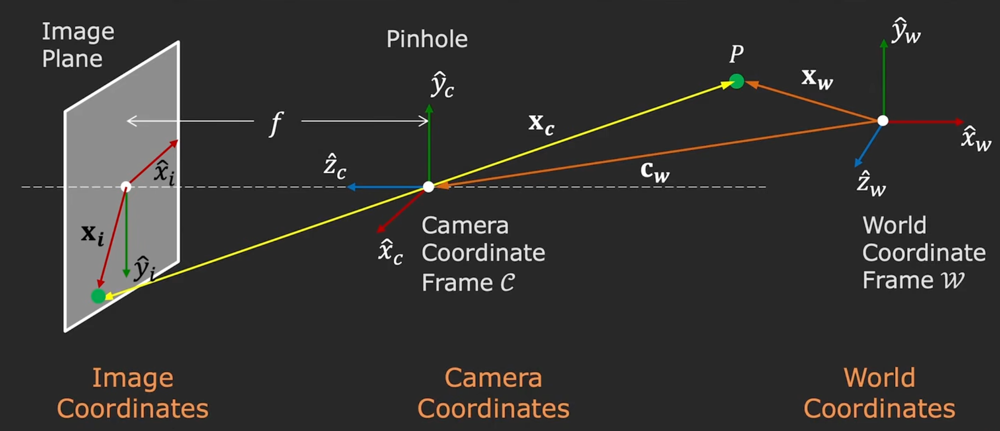

## World CS $\rightarrow$ Camera CS $\rightarrow$ Pixels

### 1. Связь двух систем координат

Две системы координат связаны между собой с помощью **rotation** и **translation**.

**Rotation** — поворот осей системы координат, **translation** — перенос её начала.

### 2. Матрица вращения

Вращение задаётся матрицей $R$:

$$
R=
\begin{bmatrix}
r_{11} & r_{12} & r_{13}\\
r_{21} & r_{22} & r_{23}\\
r_{31} & r_{32} & r_{33}
\end{bmatrix}.
$$

### 3. Свойства матрицы вращения

Матрица $R$ ортонормальная: её строки и столбцы образуют ортонормальные наборы векторов.

Для любых двух различных столбцов $u$ и $v$:

$$
u^Tv=0,\qquad \|u\|=\|v\|=1.
$$

Поэтому:

$$
\boxed{R^TR=RR^T=I.}
$$

### 4. Перенос начала координат

Пусть $C_w$ — координаты центра камеры в мировой системе координат.

Можно было бы предположить:

$$
X_c=X_w-C_w.
$$

Однако в общем случае это равенство неверно:

$$
X_c\ne X_w-C_w,
$$

поскольку $X_c$ выражен в системе координат камеры, а разность $X_w-C_w$ — в мировой системе координат.

Чтобы выразить эту разность в системе координат камеры, нужно домножить её слева на $R$:

$$
\boxed{X_c=R(X_w-C_w).}
$$

### 5. Внешние параметры камеры

Раскроем скобки:

$$
X_c=RX_w-RC_w=RX_w+t.
$$

Введём **вектор переноса** (*translation vector*):

$$
\boxed{t=-RC_w.}
$$

Матрица $R$ и вектор $t$ называются **внешними параметрами камеры** (*extrinsics*).

Таким образом:

$$
\boxed{X_c=RX_w+t.}
$$

### 6. Запись преобразования одной матрицей

Для этого введём **однородные координаты**:

$$
\widetilde{X}_w=
\begin{bmatrix}
X_w\\
Y_w\\
Z_w\\
1
\end{bmatrix}.
$$

Тогда:

$$
\boxed{X_c=[R\mid t]\widetilde{X}_w.}
$$

Объединённая матрица имеет размер $3\times4$:

$$
[R\mid t] =
\underbrace{
\begin{bmatrix}
r_{11} & r_{12} & r_{13} & t_1\\
r_{21} & r_{22} & r_{23} & t_2\\
r_{31} & r_{32} & r_{33} & t_3
\end{bmatrix}
}_{3\times4}.
$$

### 7. Полный переход из мировых координат в пиксели

Возьмём полученный ранее переход из системы координат камеры к пикселям:

$$
\begin{bmatrix}
uZ_c\\
vZ_c\\
Z_c
\end{bmatrix} = K
\begin{bmatrix}
X_c\\
Y_c\\
Z_c
\end{bmatrix}.
$$

Вынесем $Z_c$ за скобки:

$$
Z_c
\begin{bmatrix}
u\\
v\\
1
\end{bmatrix} = K
\begin{bmatrix}
X_c\\
Y_c\\
Z_c
\end{bmatrix}.
$$

Обозначим масштабный коэффициент:

$$
\lambda=Z_c.
$$

Подставим преобразование из мировой системы координат в систему координат камеры:

$$
\boxed{
\lambda
\begin{bmatrix}
u\\
v\\
1
\end{bmatrix} = K[R\mid t]
\begin{bmatrix}
X_w\\
Y_w\\
Z_w\\
1
\end{bmatrix}.
}
$$

Теперь мы получили полный переход из мировой системы координат в пиксельную систему координат. Он выражается последней формулой.

Помимо внутренних параметров $K$, в результате калибровки мы также определяем внешние параметры камеры — матрицу вращения $R$ и вектор переноса $t$.

# 3. Постановка задачи калибровки и линейная оценка параметров камеры по 3D-калибровочному датасету

До этого мы описывали прямую задачу: как по известным параметрам камеры и координатам точки в мировой системе получить её пиксельные координаты.

Теперь поставим обратную задачу. Пусть у нас есть набор известных 3D-точек и соответствующих им точек на изображении. По этим соответствиям необходимо определить параметры камеры. Это и есть задача калибровки камеры.

Для этого объединим внутренние и внешние параметры в одну матрицу проекции $P=K[R\mid t]$, составим систему линейных уравнений и получим начальную оценку $P$. Затем из неё можно будет восстановить $K$, $R$ и $t$.

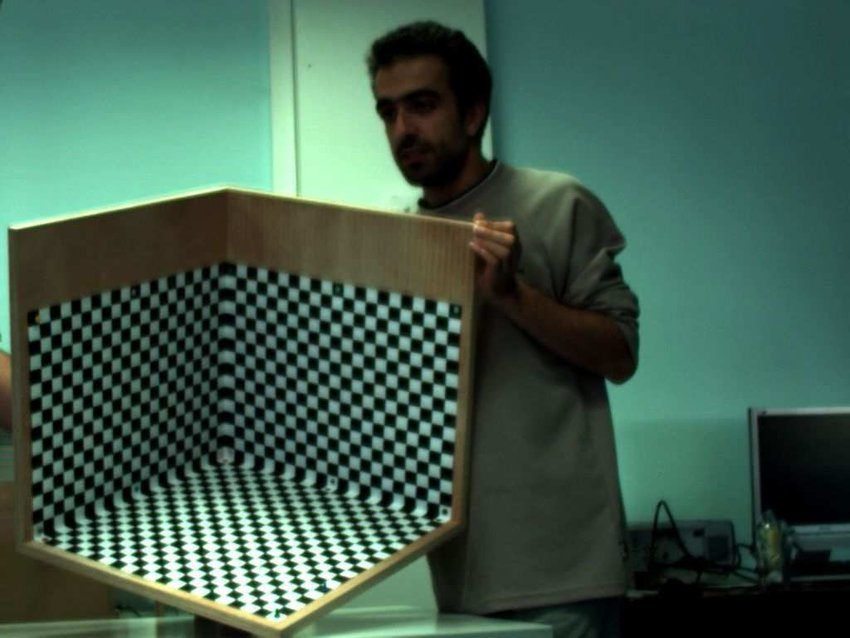

### 1. Матрица проекции камеры

Объединим внутренние и внешние параметры камеры в одну матрицу:

$$
\boxed{P=K[R\mid t].}
$$

Матрица $P$ называется **матрицей проекции камеры** (*camera projection matrix*) и имеет размер $3\times4$:

$$
P=
\begin{bmatrix}
p_{11} & p_{12} & p_{13} & p_{14}\\
p_{21} & p_{22} & p_{23} & p_{24}\\
p_{31} & p_{32} & p_{33} & p_{34}
\end{bmatrix}.
$$

### 2. От матрицы проекции к линейной системе

Запишем проекцию мировой точки в однородных координатах:

$$
\begin{bmatrix}
\widetilde u\\
\widetilde v\\
\widetilde w
\end{bmatrix} = P
\begin{bmatrix}
X_w\\
Y_w\\
Z_w\\
1
\end{bmatrix},
$$

где при $P=K[R\mid t]$:

$$
\widetilde u=uZ_c,\qquad
\widetilde v=vZ_c,\qquad
\widetilde w=Z_c.
$$

Раскроем матричное произведение и получим систему из трёх уравнений:

$$
\begin{cases}
\widetilde u=p_{11}X_w+p_{12}Y_w+p_{13}Z_w+p_{14},\\
\widetilde v=p_{21}X_w+p_{22}Y_w+p_{23}Z_w+p_{24},\\
\widetilde w=p_{31}X_w+p_{32}Y_w+p_{33}Z_w+p_{34}.
\end{cases}
$$

Чтобы получить пиксельные координаты, разделим первые две компоненты на третью:

$$
u=\frac{\widetilde u}{\widetilde w}
=\frac{p_{11}X_w+p_{12}Y_w+p_{13}Z_w+p_{14}}
{p_{31}X_w+p_{32}Y_w+p_{33}Z_w+p_{34}},
$$

$$
v=\frac{\widetilde v}{\widetilde w}
=\frac{p_{21}X_w+p_{22}Y_w+p_{23}Z_w+p_{24}}
{p_{31}X_w+p_{32}Y_w+p_{33}Z_w+p_{34}}.
$$

Умножим на знаменатель и перенесём всё в левую часть:

$$
\begin{cases}
p_{11}X_w+p_{12}Y_w+p_{13}Z_w+p_{14}
-u(p_{31}X_w+p_{32}Y_w+p_{33}Z_w+p_{34})=0,\\
p_{21}X_w+p_{22}Y_w+p_{23}Z_w+p_{24}
-v(p_{31}X_w+p_{32}Y_w+p_{33}Z_w+p_{34})=0.
\end{cases}
$$

Соберём элементы матрицы $P$ **по строкам** в вектор параметров $p$:

$$
p=
\begin{bmatrix}
p_{11}\\p_{12}\\p_{13}\\p_{14}\\
p_{21}\\p_{22}\\p_{23}\\p_{24}\\
p_{31}\\p_{32}\\p_{33}\\p_{34}
\end{bmatrix}.
$$

Тогда для одного соответствия получаем:

$$
\begin{bmatrix}
X_w&Y_w&Z_w&1&0&0&0&0&-uX_w&-uY_w&-uZ_w&-u\\
0&0&0&0&X_w&Y_w&Z_w&1&-vX_w&-vY_w&-vZ_w&-v
\end{bmatrix}
p=0.
$$

Обозначим этот блок матрицы как $A_i$. Объединяя блоки для всех соответствий, получаем:

$$
A=
\begin{bmatrix}
A_1\\
A_2\\
\vdots\\
A_N
\end{bmatrix},
\qquad
\boxed{Ap=0.}
$$

Таким образом, для одного соответствия

$$
\text{pixel}\;\longleftrightarrow\;\text{3D coordinate}
$$

мы получаем **два линейных уравнения относительно элементов матрицы $P$**.

Следовательно:

$$
\boxed{N\text{ точек}\;\longrightarrow\;2N\text{ уравнений}.}
$$

### 3. Ремарка об однородных координатах

Точку $(x,y)$ можно представить однородными координатами:

$$
(x,y)\;\longleftrightarrow\;
(\widetilde u,\widetilde v,\widetilde w),
$$

где:

$$
x=\frac{\widetilde u}{\widetilde w},
\qquad
y=\frac{\widetilde v}{\widetilde w},
\qquad
\widetilde w\ne0.
$$

Поэтому однородные координаты

$$
(2,3,1),\qquad(4,6,2),\qquad(6,9,3)
$$

представляют одну и ту же точку:

$$
(x,y)=(2,3).
$$

Если обозначить однородный вектор как $k$, то:

$$
\boxed{k\sim\lambda k,\qquad\lambda\ne0.}
$$

Знак $\sim$ означает эквивалентность с точностью до ненулевого общего масштаба.

### 4. Почему у матрицы проекции 11 степеней свободы

Теперь применим ту же идею к матрице проекции.

Пусть:

$$
\widetilde x=P\widetilde X.
$$

Умножим матрицу камеры на ненулевой коэффициент:

$$
P'=\lambda P,\qquad\lambda\ne0.
$$

Тогда:

$$
\widetilde x'=P'\widetilde X
=\lambda P\widetilde X
=\lambda\widetilde x.
$$

Но $\widetilde x'$ и $\widetilde x$ задают одну и ту же точку изображения:

$$
\widetilde x'\sim\widetilde x.
$$

Следовательно:

$$
\boxed{P\sim\lambda P.}
$$

Матрица проекции определяется не как одна конкретная матрица, а как целое семейство:

$$
\boxed{\{\lambda P:\lambda\ne0\}.}
$$

Наборы параметров

$$
(p_{11},\ldots,p_{34})
\qquad\text{и}\qquad
(\lambda p_{11},\ldots,\lambda p_{34})
$$

задают одну и ту же камеру: после деления на третью однородную координату общий масштаб сокращается.

Всего в матрице $P$ двенадцать чисел. Один общий масштаб не определяется по изображениям, поэтому независимых параметров на один меньше:

$$
\boxed{12-1=11\text{ степеней свободы}.}
$$

#### Почему можно убрать одну степень свободы?

Посмотрим сначала не на $\mathbb R^{12}$, а на $\mathbb R^2$.

Пусть у нас есть ненулевой вектор:

$$
c=
\begin{bmatrix}
a\\b
\end{bmatrix},
$$

и требуется задать только направление прямой, вдоль которой он лежит, а не его длину. Тогда векторы

$$
\begin{bmatrix}a\\b\end{bmatrix}
\qquad\text{и}\qquad
\begin{bmatrix}2a\\2b\end{bmatrix}
$$

для нашей задачи эквивалентны.

Если $a\ne0$, можно разделить обе компоненты на $a$:

$$
\begin{bmatrix}a\\b\end{bmatrix}
\sim
\begin{bmatrix}1\\b/a\end{bmatrix}.
$$

Теперь достаточно одного параметра $b/a$ вместо двух чисел $a$ и $b$. Если $a=0$, для такого представления нужно выбрать другую ненулевую компоненту.

Аналогично для матрицы $P$: можно зафиксировать, например,

$$
p_{34}=1
$$

при условии, что исходное $p_{34}\ne0$, или потребовать

$$
\|P\|_F=1.
$$

Поскольку $p$ содержит все элементы $P$:

$$
\|P\|_F=\|p\|_2.
$$

**Мы не удаляем информацию о камере — мы выбираем представителя среди матриц, которые дают абсолютно одинаковые проекции.**

Условие $\|p\|_2=1$ фиксирует величину масштаба, но оставляет два варианта знака: $p$ и $-p$. Они также задают одну камеру.

### 5. Минимальное число соответствий

Мы хотим решить:

$$
Ap=0.
$$

У камеры 11 независимых параметров, а каждое соответствие даёт два уравнения:

$$
2N\ge11
\quad\Longrightarrow\quad
N\ge5.5.
$$

Следовательно, необходимо не менее шести соответствий:

$$
\boxed{N\ge6.}
$$

Размерности системы:

$$
\underbrace{A}_{2N\times12}
\underbrace{p}_{12\times1} =
\underbrace{0}_{2N\times1}.
$$

При $N=6$:

$$
\underbrace{A}_{12\times12}
\underbrace{p}_{12\times1} =
\underbrace{0}_{12\times1}.
$$

**Шесть соответствий — необходимый минимум по числу уравнений, но также важна геометрия точек.** Например, точки одной плоскости не позволяют однозначно восстановить общую матрицу $P$.

### 6. Какой ранг должен быть у матрицы $A$?

Сначала рассмотрим случай шести соответствий, когда $A$ — квадратная матрица $12\times12$.

Если она невырожденная, то:

$$
\operatorname{rank}(A)=12,
$$

и существует обратная матрица $A^{-1}$. Тогда из $Ap=0$ получаем:

$$
p=A^{-1}0=0.
$$

То есть существует только **тривиальное решение**. Оно нам не подходит: нулевая матрица $P$ не задаёт камеру.

При большем числе точек $A$ прямоугольная, но вывод сохраняется: полный столбцовый ранг 12 означает, что её ядро содержит только нулевой вектор.

Следовательно, для существования ненулевого решения необходимо:

$$
\boxed{\operatorname{rank}(A)<12.}
$$

Какой именно ранг нам нужен?

Используем **теорему о ранге и дефекте**:

$$
\boxed{\dim\ker A+\operatorname{rank}(A)=n,}
$$

где $n$ — число столбцов матрицы. В нашем случае $n=12$.

Если:

$$
\operatorname{rank}(A)=11,
$$

то:

$$
\dim\ker A=12-11=1.
$$

Напомним: **ядро матрицы** — множество всех векторов, которые она переводит в нулевой вектор:

$$
\ker A=\{p:Ap=0\}.
$$

Пусть ненулевой вектор $p_0$ лежит в ядре:

$$
Ap_0=0.
$$

Тогда для любого $\lambda$:

$$
A(\lambda p_0)=\lambda Ap_0=0.
$$

Поскольку ядро одномерно, все его векторы имеют вид:

$$
p=\lambda p_0.
$$

Для ненулевых решений $\lambda\ne0$. Все они лежат вдоль одного направления и отличаются только общим масштабом. Это точно соответствует нашей ситуации:

$$
P\sim\lambda P.
$$

Поэтому в идеальном невырожденном случае мы хотим получить:

$$
\boxed{\operatorname{rank}(A)=11.}
$$

Если же:

$$
\operatorname{rank}(A)<11,
$$

то:

$$
\dim\ker A>1.
$$

Тогда существуют решения, которые уже нельзя получить друг из друга одним масштабированием, и однозначно восстановить $P$ не получится.

### 7. Неидеальные данные и решение DLT через SVD

Для идеальных данных наша задача имеет вид:

$$
\boxed{Ap=0,\qquad p\ne0,\qquad\operatorname{rank}(A)=11.}
$$

В таком случае можно найти базис ядра, например методом Гаусса, и получить решение с точностью до масштаба.

Но реальные данные неидеальны: присутствуют шум, ошибки измерений и отклонения от модели, в том числе дисторсия. Поэтому у матрицы $A$ обычно нет точного ненулевого ядра.

Вместо точного равенства будем искать:

$$
Ap\approx0.
$$

Этот подход называется **DLT — Direct Linear Transform**.

Запишем задачу как минимизацию алгебраической невязки:

$$
\boxed{
\min_{\|p\|_2=1}\|Ap\|_2^2.
}
$$

Ограничение $\|p\|_2=1$ фиксирует общий масштаб и исключает тривиальное решение $p=0$.

#### Сингулярное разложение

У этой задачи есть аналитическое решение через SVD:

$$
A=U\Sigma V^T.
$$

Следовательно:

$$
Ap=U\Sigma V^Tp.
$$

И:

$$
\|Ap\|_2^2=\|U\Sigma V^Tp\|_2^2.
$$

Обозначим:

$$
m=\Sigma V^Tp.
$$

Ортогональное преобразование $U$ сохраняет норму:

$$
\|Um\|_2^2
=m^TU^TUm
=m^Tm
=\|m\|_2^2.
$$

Поэтому:

$$
\|Ap\|_2^2=\|\Sigma V^Tp\|_2^2.
$$

Введём:

$$
q=V^Tp.
$$

Матрица $V$ также ортогональна, поэтому:

$$
\|q\|_2=\|p\|_2=1.
$$

Значит, исходная задача эквивалентна:

$$
\boxed{
\min_{\|q\|_2=1}\|\Sigma q\|_2^2.
}
$$

Матрица $\Sigma$ содержит сингулярные числа на главной диагонали, расположенные по убыванию:

$$
\sigma_1\ge\sigma_2\ge\cdots\ge\sigma_n\ge0,
\qquad n=12.
$$

Поэтому:

$$
\|\Sigma q\|_2^2
=\sigma_1^2q_1^2+\sigma_2^2q_2^2+\cdots+\sigma_n^2q_n^2,
$$

при ограничении:

$$
q_1^2+q_2^2+\cdots+q_n^2=1.
$$

Как выбрать $q$, чтобы сумма была минимальной?

Поскольку $\sigma_n$ — наименьшее сингулярное число, можно взять:

$$
q_1=\cdots=q_{n-1}=0,\qquad q_n=1.
$$

Тогда:

$$
\boxed{
\min_{\|q\|_2=1}\|\Sigma q\|_2^2=\sigma_n^2.
}
$$

Возвращаемся к $p$:

$$
q=V^Tp
\quad\Longrightarrow\quad
p=Vq.
$$

При выбранном $q$:

$$
\boxed{p=V_{:,n}.}
$$

То есть **вектор параметров $p$ — последний столбец матрицы правых сингулярных векторов $V$**. Если SVD возвращает $V^T$, нужно взять её последнюю строку.

Из двенадцати элементов найденного $p$ собираем матрицу $P$ размера $3\times4$, заполняя её по строкам.

Если наименьшее сингулярное число кратное, минимизирующее направление не единственно — это снова вопрос определённости решения.

### 8. Ошибка репроекции и нелинейное уточнение

Теперь у нас есть наблюдаемый пиксель:

$$
x_i=
\begin{bmatrix}
u_i\\
v_i
\end{bmatrix},
$$

оценённая матрица $P$ и соответствующая 3D-точка.

Поскольку $P=K[R\mid t]$ переводит мировые координаты в изображение, здесь используем **мировую точку в однородных координатах**:

$$
\widetilde X_i=
\begin{bmatrix}
X_{w,i}\\
Y_{w,i}\\
Z_{w,i}\\
1
\end{bmatrix}.
$$

Умножение на $P$ даёт однородные координаты предсказанной точки изображения:

$$
P\widetilde X_i=
\begin{bmatrix}
\widetilde u_i\\
\widetilde v_i\\
\widetilde w_i
\end{bmatrix}.
$$

Чтобы получить пиксель, необходимо выполнить **перспективное деление** (*perspective divide*):

$$
\pi\left(
\begin{bmatrix}
\widetilde u_i\\
\widetilde v_i\\
\widetilde w_i
\end{bmatrix}
\right) =
\begin{bmatrix}
\widetilde u_i/\widetilde w_i\\
\widetilde v_i/\widetilde w_i
\end{bmatrix},
\qquad \widetilde w_i\ne0.
$$

Таким образом:

$$
\boxed{
\widehat x_i=
\begin{bmatrix}
\widehat u_i\\
\widehat v_i
\end{bmatrix}
=\pi(P\widetilde X_i).
}
$$

Зачем это делать? Нас интересует, насколько далеко предсказанный пиксель находится от реально наблюдаемого.

Введём расстояние между ними:

$$
e_i=
\left\|
\begin{bmatrix}
u_i\\
v_i
\end{bmatrix} -
\begin{bmatrix}
\widehat u_i\\
\widehat v_i
\end{bmatrix}
\right\|_2 =
\sqrt{(u_i-\widehat u_i)^2+(v_i-\widehat v_i)^2}.
$$

Это **ошибка репроекции** (*reprojection error*) одной точки.

Суммируя квадраты ошибок по всем точкам, получаем целевую функцию:

$$
\boxed{
E(P)=\sum_{i=1}^{N}
\left[
(u_i-\widehat u_i)^2+(v_i-\widehat v_i)^2
\right].
}
$$

Или в компактной форме:

$$
\boxed{
E(P)=\sum_{i=1}^{N}
\|x_i-\pi(P\widetilde X_i)\|_2^2.
}
$$

#### Почему задача нелинейная?

Обозначим строки матрицы $P$ как $p_1^T,p_2^T,p_3^T$:

$$
P=
\begin{bmatrix}
p_1^T\\
p_2^T\\
p_3^T
\end{bmatrix}.
$$

Тогда:

$$
\widetilde u_i=p_1^T\widetilde X_i,\qquad
\widetilde v_i=p_2^T\widetilde X_i,\qquad
\widetilde w_i=p_3^T\widetilde X_i.
$$

После перспективного деления:

$$
\boxed{
\widehat u_i=
\frac{p_1^T\widetilde X_i}{p_3^T\widetilde X_i},
\qquad
\widehat v_i=
\frac{p_2^T\widetilde X_i}{p_3^T\widetilde X_i}.
}
$$

Параметры $P$ находятся и в числителе, и в знаменателе. Поэтому минимизация ошибки репроекции — **нелинейная задача**:

$$
\boxed{\min_P E(P).}
$$

Одна SVD уже не даёт её решения. Здесь используют **нелинейный метод наименьших квадратов** (*nonlinear least squares*), например **метод Левенберга — Марквардта**.

#### Метод Левенберга — Марквардта

Начальным приближением служит матрица $P$, найденная методом DLT.

На каждой итерации метод линеаризует невязки в окрестности текущих параметров и вычисляет поправку. Демпфирование регулирует размер и устойчивость шага.

Если обозначить независимые параметры камеры через $\theta$, вектор невязок через $r(\theta)$, а его якобиан через $J$, шаг имеет вид:

$$
(J^TJ+\mu I)\Delta\theta=-J^Tr,
\qquad \mu>0.
$$

При малом $\mu$ шаг близок к шагу Гаусса — Ньютона, при большом — к короткому градиентному шагу. Кандидат проверяют по настоящей ошибке репроекции: удачный шаг принимают, неудачный отклоняют и увеличивают демпфирование.

Во время уточнения также нужно фиксировать общий масштаб $P$, чтобы не оптимизировать избыточный параметр.

Таким образом:

$$
\boxed{
\text{DLT: начальная оценка }P
\;\longrightarrow\;
\text{нелинейный МНК: уточнение }P.
}
$$

DLT минимизирует алгебраическую невязку $\|Ap\|^2$, а нелинейное уточнение — ошибку в пикселях. Метод Левенберга — Марквардта ищет локальный минимум, поэтому начальная оценка важна.

### 9. Восстановление $K$, $R$ и $t$

После уточнения матрицы $P$ необходимо получить параметры камеры:

$$
P=K[R\mid t].
$$

Матрица внутренних параметров имеет верхнетреугольный вид:

$$
K=
\begin{bmatrix}
f_x&0&c_x\\
0&f_y&c_y\\
0&0&1
\end{bmatrix},
$$

Матрица $R$ — ортогональная матрица вращения:

$$
R^TR=I,\qquad\det R=1.
$$

Разобьём $P$ на левый блок $M$ размера $3\times3$ и последний столбец $p_4$:

$$
P=[M\mid p_4].
$$

Раскроем произведение:

$$
P=K[R\mid t]=[KR\mid Kt].
$$

Следовательно:

$$
\boxed{M=KR,\qquad p_4=Kt.}
$$

Чтобы разделить $M$ на верхнетреугольную матрицу и ортогональную матрицу, используем **RQ-разложение**. Оно позволяет получить $K$ и $R$.

При разложении согласуем знаки так, чтобы фокусные расстояния были положительными, а $\det R=1$. Затем нормируем $K$ до $K_{33}=1$, одновременно приводя **всю матрицу $P$, включая её последний столбец**, к тому же масштабу.

После согласования масштаба из равенства

$$
p_4=Kt
$$

получаем:

$$
K^{-1}p_4=K^{-1}Kt=t.
$$

Таким образом:

$$
\boxed{t=K^{-1}p_4.}
$$

Здесь $p_4$ — последний столбец матрицы $P$, а не четвёртый элемент вектора параметров $p$.

В итоге из оценённой матрицы проекции получаем **внутренние параметры $K$** и **внешние параметры $R,t$** камеры.

### 10. Геометрические проверки после оценки

- $R^TR\approx I$ и $\det R\approx+1$.
- $f_x,f_y>0$, $K_{33}=1$.

# 4. Решение задачи калибровки по 2D-калибровочному датасету

До этого мы рассматривали калибровку по набору известных пространственных точек $(X_w,Y_w,Z_w)$ и соответствующих им пиксельных координат. Эти соответствия позволяли оценить матрицу проекции $P$, а затем восстановить внутренние параметры камеры $K$ и внешние параметры $R$ и $t$.

Теперь рассмотрим калибровку с использованием **плоского паттерна**, например шахматной доски. Выберем мировую систему координат так, чтобы плоскость паттерна совпадала с плоскостью $Z_w=0$. Тогда каждая точка паттерна задаётся координатами $(X_w,Y_w,0)$.

Как это ограничение изменяет модель проекции и какие данные необходимы для восстановления параметров камеры?

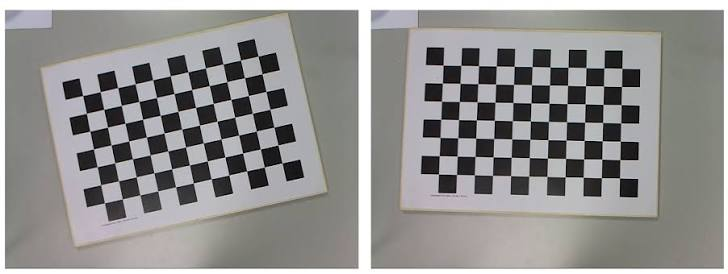

### 1. От матрицы проекции к гомографии

Выберем мировую систему координат так, чтобы шахматная доска лежала в плоскости $Z_w=0$.

Тогда полная модель проекции принимает вид:

$$
\lambda
\begin{bmatrix}
u\\
v\\
1
\end{bmatrix} = K[R\mid t]
\begin{bmatrix}
X_w\\
Y_w\\
0\\
1
\end{bmatrix}.
$$

Обозначим столбцы матрицы вращения:

$$
R=[r_1\;r_2\;r_3].
$$

Раскроем матричное произведение:

$$
\lambda
\begin{bmatrix}
u\\
v\\
1
\end{bmatrix} =
K[r_1\;r_2\;r_3\;t]
\begin{bmatrix}
X_w\\
Y_w\\
0\\
1
\end{bmatrix} =
K(r_1X_w+r_2Y_w+r_3\cdot0+t).
$$

Поскольку $Z_w=0$, слагаемое с третьим столбцом вращения исчезает:

$$
\lambda
\begin{bmatrix}
u\\
v\\
1
\end{bmatrix} =
K(r_1X_w+r_2Y_w+t)
=K[r_1\;r_2\;t]
\begin{bmatrix}
X_w\\
Y_w\\
1
\end{bmatrix}.
$$

Введём матрицу:

$$
\boxed{H=K[r_1\;r_2\;t].}
$$

Получаем:

$$
\boxed{
\lambda
\begin{bmatrix}
u\\
v\\
1
\end{bmatrix} =
H
\begin{bmatrix}
X_w\\
Y_w\\
1
\end{bmatrix}.
}
$$

Матрица $H$ задаёт **гомографию** между плоскостью шахматной доски и плоскостью изображения.

В общем случае **гомография** — невырожденное проективное преобразование между двумя плоскостями. Она переводит прямые в прямые, но не обязана сохранять расстояния, углы и параллельность.

Гомографии используют для выравнивания перспективы, преобразования изображений плоских объектов, совмещения изображений и калибровки камеры по плоскому паттерну.

Здесь предполагается идеальная проекция без дисторсии и ракурс, при котором доска не проецируется в линию.

### 2. Линейная оценка гомографии

Матрица гомографии имеет размер $3\times3$:

$$
H=
\begin{bmatrix}
h_{11}&h_{12}&h_{13}\\
h_{21}&h_{22}&h_{23}\\
h_{31}&h_{32}&h_{33}
\end{bmatrix}.
$$

Раскроем произведение:

$$
\begin{cases}
\lambda u=h_{11}X_w+h_{12}Y_w+h_{13},\\
\lambda v=h_{21}X_w+h_{22}Y_w+h_{23},\\
\lambda=h_{31}X_w+h_{32}Y_w+h_{33}.
\end{cases}
$$

Разделим первые два уравнения на третье:

$$
u=
\frac{h_{11}X_w+h_{12}Y_w+h_{13}}
{h_{31}X_w+h_{32}Y_w+h_{33}},
\qquad
v=
\frac{h_{21}X_w+h_{22}Y_w+h_{23}}
{h_{31}X_w+h_{32}Y_w+h_{33}}.
$$

Умножим на знаменатель и перенесём всё в левую часть:

$$
\begin{cases}
h_{11}X_w+h_{12}Y_w+h_{13}
-u(h_{31}X_w+h_{32}Y_w+h_{33})=0,\\
h_{21}X_w+h_{22}Y_w+h_{23}
-v(h_{31}X_w+h_{32}Y_w+h_{33})=0.
\end{cases}
$$

Соберём элементы $H$ по строкам в вектор:

$$
h=
\begin{bmatrix}
h_{11}\\h_{12}\\h_{13}\\
h_{21}\\h_{22}\\h_{23}\\
h_{31}\\h_{32}\\h_{33}
\end{bmatrix}.
$$

Для одного соответствия получаем:

$$
\begin{bmatrix}
X_w&Y_w&1&0&0&0&-uX_w&-uY_w&-u\\
0&0&0&X_w&Y_w&1&-vX_w&-vY_w&-v
\end{bmatrix}
h=0.
$$

Объединяя уравнения всех точек, получаем знакомую задачу:

$$
\boxed{Ah=0.}
$$

В матрице $H$ девять элементов, но общий масштаб не определяется:

$$
H\sim\lambda H,\qquad\lambda\ne0.
$$

Поэтому у гомографии:

$$
\boxed{9-1=8\text{ степеней свободы}.}
$$

Каждая точка даёт два уравнения:

$$
2N\ge8
\quad\Longrightarrow\quad
\boxed{N\ge4.}
$$

Таким образом, минимально нужны **четыре соответствия**, которые дают восемь уравнений. Для минимального набора точки должны находиться в общем положении: никакие три не должны лежать на одной прямой.

Размерности системы:

$$
\underbrace{A}_{2N\times9}
\underbrace{h}_{9\times1} =
\underbrace{0}_{2N\times1}.
$$

Для идеальных невырожденных данных:

$$
\operatorname{rank}(A)=8,
\qquad
\dim\ker A=1.
$$

Для неидеальных данных решаем:

$$
\boxed{\min_{\|h\|_2=1}\|Ah\|_2^2.}
$$

Как и раньше, используем SVD:

$$
A=U\Sigma V^T.
$$

Вектор $h$ — последний столбец полного правого базиса $V$. Из него собираем матрицу $H$ размера $3\times3$.

При ровно четырёх соответствиях $A$ имеет размер $8\times9$: важно получить полный правый базис, включая девятый вектор, задающий ядро.

### 3. Почему используют много точек и несколько кадров?

На практике:

1. **Берут больше четырёх точек на одном изображении.** Это позволяет оценивать гомографию по переопределённой системе и уменьшать влияние ошибок измерений.

2. **Используют точки, распределённые по плоскости, а не лежащие на одной прямой.** Точки одной прямой не определяют преобразование всей плоскости.

3. **Снимают несколько кадров с разными наклонами доски и для каждого оценивают свою $H$.** Затем объединяют ограничения от этих гомографий, чтобы найти общую матрицу внутренних параметров $K$.

При этом $K$ должна оставаться одинаковой для всех кадров, а внешние параметры $R$ и $t$ могут меняться.

### 4. Как восстановить параметры камеры из гомографий?

При калибровке по пространственным точкам мы оценивали матрицу $P$ и выполняли RQ-разложение её левого блока:

$$
P=K[R\mid t].
$$

Для плоского паттерна мы оцениваем:

$$
H\sim K[r_1\;r_2\;t].
$$

Матрица $[r_1\;r_2\;t]$ не является матрицей вращения, поэтому прежний способ разделения через RQ здесь напрямую не подходит.

Вместо этого используем свойства первых двух столбцов вращения и объединяем информацию нескольких кадров.

#### 4.1. Два ограничения от одного кадра

Для одного кадра обозначим столбцы оценённой гомографии:

$$
H=[h_1\;h_2\;h_3].
$$

Гомография найдена с точностью до общего масштаба, поэтому:

$$
H=\lambda_H K[r_1\;r_2\;t].
$$

Здесь $\lambda_H$ — общий масштаб матрицы $H$. Он отличается от коэффициента $\lambda$ в уравнении проекции, который зависит от точки.

Следовательно:

$$
h_1=\lambda_H Kr_1,\qquad
h_2=\lambda_H Kr_2,\qquad
h_3=\lambda_H Kt.
$$

Умножим слева на $K^{-1}$:

$$
K^{-1}h_1=\lambda_H r_1,\qquad
K^{-1}h_2=\lambda_H r_2.
$$

Первые два столбца матрицы вращения ортогональны и имеют единичную норму:

$$
r_1^Tr_2=0,\qquad
\|r_1\|=\|r_2\|=1.
$$

Из ортогональности:

$$
(K^{-1}h_1)^T(K^{-1}h_2)
=\lambda_H^2r_1^Tr_2=0.
$$

Получаем первое условие:

$$
\boxed{h_1^TK^{-T}K^{-1}h_2=0.}
$$

Из равенства норм:

$$
(K^{-1}h_1)^T(K^{-1}h_1) =
(K^{-1}h_2)^T(K^{-1}h_2).
$$

Получаем второе условие:

$$
\boxed{
h_1^TK^{-T}K^{-1}h_1
-h_2^TK^{-T}K^{-1}h_2=0.
}
$$

Таким образом, **каждый кадр даёт два ограничения на внутренние параметры камеры**.

#### 4.2. Введение матрицы $B$

Чтобы не записывать каждый раз произведение $K^{-T}K^{-1}$, введём:

$$
\boxed{B=K^{-T}K^{-1}.}
$$

Матрица $B$ симметрична, поскольку имеет вид $A^TA$ при $A=K^{-1}$:

$$
B^T=B.
$$

Поэтому:

$$
B=
\begin{bmatrix}
B_{11}&B_{12}&B_{13}\\
B_{12}&B_{22}&B_{23}\\
B_{13}&B_{23}&B_{33}
\end{bmatrix}.
$$

Наши два условия принимают вид:

$$
\boxed{
\begin{cases}
h_1^TBh_2=0,\\
h_1^TBh_1-h_2^TBh_2=0.
\end{cases}
}
$$

Они линейны относительно элементов $B$.

#### 4.3. Линейная система для $B$

Соберём независимые элементы симметричной матрицы в вектор:

$$
b=
\begin{bmatrix}
B_{11}\\
B_{12}\\
B_{22}\\
B_{13}\\
B_{23}\\
B_{33}
\end{bmatrix}.
$$

Чтобы явно записать коэффициенты уравнений, введём:

$$
v_{ab}=
\begin{bmatrix}
h_{1a}h_{1b}\\
h_{1a}h_{2b}+h_{2a}h_{1b}\\
h_{2a}h_{2b}\\
h_{1a}h_{3b}+h_{3a}h_{1b}\\
h_{2a}h_{3b}+h_{3a}h_{2b}\\
h_{3a}h_{3b}
\end{bmatrix}.
$$

Тогда:

$$
h_a^TBh_b=v_{ab}^Tb.
$$

Для одного кадра:

$$
\begin{bmatrix}
v_{12}^T\\
(v_{11}-v_{22})^T
\end{bmatrix}
b=0.
$$

Соберём такие пары строк для всех кадров в матрицу $A$:

$$
\boxed{Ab=0.}
$$

Здесь $A$ — новая матрица системы: она составлена из ограничений на $B$, а не из соответствий отдельных точек.

В симметричной матрице $B$ шесть независимых элементов. Однородная система определяет их с точностью до масштаба, поэтому остаётся:

$$
6-1=5\text{ степеней свободы}.
$$

Если кадров $M$, то:

$$
2M\ge5
\quad\Longrightarrow\quad
\boxed{M\ge3.}
$$

Три кадра дают шесть уравнений:

$$
\underbrace{A}_{6\times6}
\underbrace{b}_{6\times1} =
\underbrace{0}_{6\times1}.
$$

В идеальном случае нужен ранг:

$$
\operatorname{rank}(A)=5.
$$

Поэтому важны **разные наклоны доски**, дающие независимые ограничения. Три почти одинаковых кадра не гарантируют определённости решения.

Это минимальное число кадров для описанной оценки общей симметричной $B$ без дополнительных ограничений на $K$. Заранее известные свойства камеры, например нулевой skew, могут уменьшить теоретический минимум.

Для реальных данных решаем:

$$
\boxed{\min_{\|b\|_2=1}\|Ab\|_2^2.}
$$

Выполняем SVD, находим $b$ и восстанавливаем симметричную матрицу $B$.

#### 4.4. Восстановление $K$ через разложение Холецкого

Мы знаем:

$$
B=K^{-T}K^{-1}.
$$

Для невырожденной камеры эта матрица не только симметрична, но и положительно определена:

$$
a^TBa=\|K^{-1}a\|_2^2>0
\qquad\text{для любого }a\ne0.
$$

**Разложение Холецкого** представляет симметричную положительно определённую матрицу как произведение треугольной матрицы и её транспонированной:

$$
B=LL^T,
$$

где $L$ — нижнетреугольная матрица. Эквивалентная запись через верхнетреугольную матрицу $U=L^T$:

$$
B=U^TU.
$$

Поскольку $K$ верхнетреугольная, её обратная матрица $K^{-1}$ также верхнетреугольная.

Следовательно, с учётом неопределённого масштаба найденной $B$:

$$
U\sim K^{-1}.
$$

Поэтому вычисляем:

$$
\widetilde K=U^{-1},
\qquad
\boxed{K=\frac{\widetilde K}{\widetilde K_{33}}.}
$$

Из найденной матрицы получаем:

$$
\boxed{
f_x=K_{11},\qquad
f_y=K_{22},\qquad
c_x=K_{13},\qquad
c_y=K_{23}.
}
$$

#### 4.5. Восстановление $R$ и $t$

После нахождения $K$ вернёмся к гомографии каждого кадра:

$$
h_1=\lambda_H Kr_1,\qquad
h_2=\lambda_H Kr_2,\qquad
h_3=\lambda_H Kt.
$$

Введём коэффициент:

$$
\alpha=\frac{1}{\lambda_H}.
$$

Тогда:

$$
r_1=\alpha K^{-1}h_1,\qquad
r_2=\alpha K^{-1}h_2,\qquad
t=\alpha K^{-1}h_3.
$$

Как найти $\alpha$?

Из условия $\|r_1\|=1$:

$$
1=\|\alpha K^{-1}h_1\|
=|\alpha|\|K^{-1}h_1\|.
$$

Следовательно:

$$
\boxed{|\alpha|=\frac{1}{\|K^{-1}h_1\|}.}
$$

Аналогично:

$$
|\alpha|=\frac{1}{\|K^{-1}h_2\|}.
$$

Теперь находим первые два столбца вращения и перенос:

$$
\boxed{
r_1=\alpha K^{-1}h_1,\qquad
r_2=\alpha K^{-1}h_2,\qquad
t=\alpha K^{-1}h_3.
}
$$

#### 4.6. Как восстановить исчезнувший столбец $r_3$?

Третий столбец $r_3$ исчез из уравнения проекции, поскольку он умножался на $Z_w=0$. Однако он не является независимым от первых двух столбцов: матрица вращения задаёт правый ортонормированный базис.

Поэтому после восстановления $r_1$ и $r_2$ находим:

$$
\boxed{r_3=r_1\times r_2.}
$$

Таким образом, восстанавливается вся матрица вращения.

### 5. Совместное нелинейное уточнение параметров

Полученные матрица $K$ и внешние параметры $R,t$ каждого кадра являются начальными оценками.

Как и при калибровке по пространственным точкам, следующим шагом минимизируем ошибку репроекции. Теперь внутренние параметры $K$ общие для всех кадров, а внешние параметры $R_j,t_j$ определяются отдельно для каждого кадра $j$.

Для точки паттерна:

$$
X_i=
\begin{bmatrix}
X_{w,i}\\
Y_{w,i}\\
0
\end{bmatrix}
$$

предсказанный пиксель в кадре $j$ имеет вид:

$$
\widehat x_{ij}=\pi\left(K(R_jX_i+t_j)\right).
$$

Тогда задача уточнения:

$$
\boxed{
\min_{K,\{R_j,t_j\}}
\sum_j\sum_i
\left\|
x_{ij}-\pi\left(K(R_jX_i+t_j)\right)
\right\|_2^2,
\qquad R_j\in SO(3).
}
$$

Её решают методами нелинейных наименьших квадратов, например методом Левенберга — Марквардта.

# 5. Практическая часть

### 1. Сбор датасета для калибровки

При съёмке важно:

1. Закрепить паттерн на плоской поверхности и проверить размер клетки на распечатке.
2. Снимать с разных ракурсов: нужны как фронтальные виды, так и наклоны относительно камеры.
3. Размещать доску в разных частях кадра, включая области у краёв.
4. Менять размер доски в кадре расстоянием до неё, **не зумом**.
5. Сохранять одинаковые зум, фокусировку и разрешение во всей серии.
6. Использовать достаточно короткую выдержку, избегать смаза, бликов и пересветов. Все внутренние углы должны быть видимы и резки.

Соберём **20 кадров**:

- **15 — для калибровки:** разные ракурсы, положения и масштабы доски.
- **5 — для тестирования:** отдельные качественные снимки, не участвующие в калибровке.

На тестовых кадрах фиксируем найденные $K$ и дисторсию, оцениваем только $R,t$ и проверяем ошибку репроекции.

## 2. Настройки и координаты углов доски

In [8]:
from pathlib import Path

import cv2
import numpy as np
import matplotlib.pyplot as plt

DATA_DIR = Path(
    "/Users/elistratovm/Documents/Studying/"
    "3D_CV_MSU/seminar_3/calibration_data"
)

CALIBRATION_DIR = DATA_DIR / "calibration"
TEST_DIR = DATA_DIR / "test"

# Число ВНУТРЕННИХ углов: (по горизонтали, по вертикали).
PATTERN_SIZE = (12, 8)

# Фактический размер клетки на распечатке, мм.
SQUARE_SIZE = 20.0

# Известные координаты углов в системе координат доски:
# (0, 0, 0), (20, 0, 0), ..., (0, 20, 0), ...
cols, rows = PATTERN_SIZE

object_points_template = np.zeros((rows * cols, 3), dtype=np.float32) # Создаём массив размером «число углов × 3»
object_points_template[:, :2] = (
    np.mgrid[0:cols, 0:rows].T.reshape(-1, 2) * SQUARE_SIZE
) # Создаём сетку номеров столбцов и строк

image_paths = sorted(
    path
    for path in CALIBRATION_DIR.iterdir()
    if path.suffix.lower() in {".jpg", ".jpeg", ".png"}
)

if not image_paths:
    raise FileNotFoundError(f"В папке нет изображений: {CALIBRATION_DIR}")

print(f"Калибровочных изображений: {len(image_paths)}")
print(f"Внутренних углов на доске: {cols} × {rows} = {cols * rows}")
print("Первые пять 3D-точек, мм:")
print(object_points_template[:5])

Калибровочных изображений: 10
Внутренних углов на доске: 12 × 8 = 96
Первые пять 3D-точек, мм:
[[ 0.  0.  0.]
 [20.  0.  0.]
 [40.  0.  0.]
 [60.  0.  0.]
 [80.  0.  0.]]


## 3. Поиск и уточнение углов

In [10]:
# Списки соответствий для последующей калибровки.
object_points = []  # Известные 3D-точки доски для каждого принятого кадра.
image_points = []   # Измеренные пиксельные координаты этих точек.
accepted_paths = []
rejected_paths = []
previews = []

image_size = None  # OpenCV использует порядок (ширина, высота).

# Условия остановки уточнения углов для cornerSubPix - остановка при малых изменениях, число итераций, порог изменения координат 
criteria = ( 
    cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER,
    50,
    1e-3,
)

flags = (
    cv2.CALIB_CB_ADAPTIVE_THRESH # Вместо использования одного фиксированного порога яркости для всего кадра
    # функция преобразует изображение в черно-белое (бинаризует), рассчитывая порог индивидуально для каждого участка
    | cv2.CALIB_CB_NORMALIZE_IMAGE # Перед поиском углов функция нормализует яркость и контрастность кадра
)


for path in image_paths:
    image = cv2.imread(
        str(path),
        cv2.IMREAD_COLOR | cv2.IMREAD_IGNORE_ORIENTATION,
    )

    if image is None:
        rejected_paths.append(path)
        print(f"[ОШИБКА ЧТЕНИЯ] {path.name}")
        continue

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY) # Получаем одноканальное изображение в оттенках серого. Для поиска углов важны перепады яркости между чёрными и белыми клетками
    current_size = (gray.shape[1], gray.shape[0])

    if image_size is None:
        image_size = current_size
    elif current_size != image_size:
        raise ValueError(
            f"{path.name}: размер {current_size}, ожидался {image_size}. "
            "Изображения должны иметь согласованные размеры и ориентацию."
        )

    # Метод findChessboardCorners ищет четырёхугольные области клеток и проверяет, образуют ли они шахматную сетку заданного размера
    found, corners = cv2.findChessboardCorners(
        gray,
        PATTERN_SIZE,
        flags,
    )

    preview = image.copy()

    if found:
        # Уточняем координаты углов до субпиксельной точности.
        corners = cv2.cornerSubPix( # Метод анализирует градиенты яркости в окрестности угла и итеративно уточняет его положение
            gray,
            corners,
            winSize=(5, 5),
            zeroZone=(-1, -1),
            criteria=criteria,
        )

        object_points.append(object_points_template.copy())
        image_points.append(corners)
        accepted_paths.append(path)

        cv2.drawChessboardCorners( # Визуализация
            preview,
            PATTERN_SIZE,
            corners,
            found,
        )

        status = f"OK: {len(corners)} углов"
        print(f"[OK] {path.name}: {len(corners)} углов")
    else:
        rejected_paths.append(path)
        status = "Углы не найдены"
        print(f"[НЕ НАЙДЕНО] {path.name}")

    previews.append(
        (path.name, cv2.cvtColor(preview, cv2.COLOR_BGR2RGB), status)
    )

print()
print(f"Размер изображений: {image_size}")
print(f"Принято: {len(accepted_paths)}")
print(f"Не принято: {len(rejected_paths)}")

[OK] IMG_0004.JPG: 96 углов
[OK] IMG_0005.JPG: 96 углов
[OK] IMG_0006.JPG: 96 углов
[OK] IMG_0007.JPG: 96 углов
[OK] IMG_0009.JPG: 96 углов
[OK] IMG_0010.JPG: 96 углов
[OK] IMG_0012.JPG: 96 углов
[OK] IMG_0014.JPG: 96 углов
[OK] IMG_0018.JPG: 96 углов
[OK] IMG_0019.JPG: 96 углов

Размер изображений: (1024, 768)
Принято: 10
Не принято: 0


## 4. Визуальная проверка

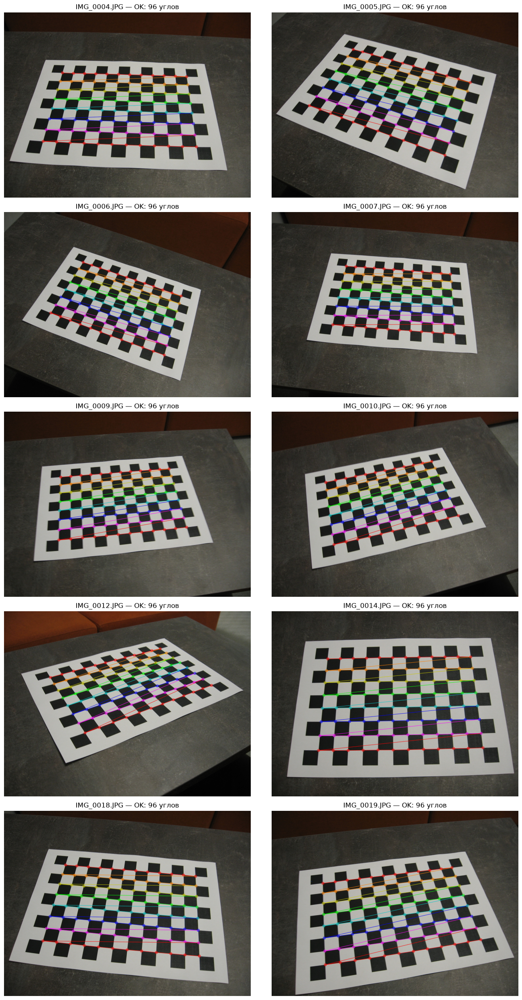

In [11]:
if not previews:
    raise RuntimeError("Нет изображений для отображения.")

ncols = 2
nrows = (len(previews) + ncols - 1) // ncols

fig, axes = plt.subplots(
    nrows,
    ncols,
    figsize=(14, 5 * nrows),
    squeeze=False,
)

for ax in axes.flat:
    ax.axis("off")

for ax, (name, image, status) in zip(axes.flat, previews):
    ax.imshow(image)
    ax.set_title(f"{name} — {status}")

plt.tight_layout()
plt.show()

## 5. Калибровка камеры

In [14]:
if len(object_points) < 3:
    raise RuntimeError("Недостаточно кадров для калибровки.")

# О дисторсии - см. ниже
rms, K, dist_coeffs, rvecs, tvecs = cv2.calibrateCamera(
    objectPoints=object_points,
    imagePoints=image_points,
    imageSize=image_size,
    cameraMatrix=None,
    distCoeffs=None,
)

np.set_printoptions(precision=6, suppress=True)

print("Матрица внутренних параметров K:")
print(K)

print("\nФокусные расстояния в пикселях:")
print(f"fx = {K[0, 0]:.3f}")
print(f"fy = {K[1, 1]:.3f}")

print("\nГлавная точка в пикселях:")
print(f"cx = {K[0, 2]:.3f}")
print(f"cy = {K[1, 2]:.3f}")

print("\nКоэффициенты дисторсии:")
for name, value in zip(
    ("k1", "k2", "p1", "p2", "k3"),
    dist_coeffs.ravel(),
):
    print(f"{name} = {value:.6f}")

print(f"\nОбщая RMS-ошибка репроекции: {rms:.4f} px")

Матрица внутренних параметров K:
[[1104.084282    0.        536.990805]
 [   0.       1097.263833  337.887872]
 [   0.          0.          1.      ]]

Фокусные расстояния в пикселях:
fx = 1104.084
fy = 1097.264

Главная точка в пикселях:
cx = 536.991
cy = 337.888

Коэффициенты дисторсии:
k1 = -0.194422
k2 = 0.507278
p1 = 0.003686
p2 = 0.002966
k3 = -1.281988

Общая RMS-ошибка репроекции: 0.2580 px



**Дисторсия**

Реальный объектив отклоняется от идеальной pinhole-модели: радиальная дисторсия связана с оптикой объектива, тангенциальная — с несовершенством взаимного расположения его элементов и сенсора.

После перспективного деления получаем нормализованные координаты:

$$
x_n=\frac{X_c}{Z_c},\qquad y_n=\frac{Y_c}{Z_c},
\qquad r^2=x_n^2+y_n^2.
$$

Далее учитываем дисторсию. В стандартной модели с пятью коэффициентами:

$$
x_d=x_n(1+k_1r^2+k_2r^4+k_3r^6)
+2p_1x_ny_n+p_2(r^2+2x_n^2),
$$

$$
y_d=y_n(1+k_1r^2+k_2r^4+k_3r^6)
+p_1(r^2+2y_n^2)+2p_2x_ny_n.
$$

Здесь $k_1,k_2,k_3$ — коэффициенты радиальной, $p_1,p_2$ — тангенциальной дисторсии. Только затем переходим к пикселям:

$$
\boxed{u=f_xx_d+c_x,\qquad v=f_yy_d+c_y.}
$$

`calibrateCamera` оценивает эти коэффициенты совместно с параметрами камеры и возвращает их в `dist_coeffs` в порядке $(k_1,k_2,p_1,p_2,k_3)$.

Таким образом, полное преобразование выглядит следующим образом:

$$
\text{World CS}
\xrightarrow{R,t}
\text{Camera CS}
\xrightarrow{\text{perspective divide}}
(x_n,y_n)
\xrightarrow{\text{distortion}}
(x_d,y_d)
\xrightarrow{K}
\text{Pixels }(u,v).
$$

**Среднеквадратичная ошибка репроекции — RMS**

`rms`, который возвращает `cv2.calibrateCamera`, — это **среднеквадратичная ошибка репроекции по всем углам всех калибровочных кадров**, в пикселях.

Для каждого угла у нас есть:

- измеренные координаты $(u_{ij},v_{ij})$ — углы, найденные на фотографии и уточнённые через `cornerSubPix`;
- предсказанные координаты $(\hat u_{ij},\hat v_{ij})$ — репроекции известных 3D-точек доски.

Здесь $j$ — номер кадра, $i$ — номер угла на нём. Репроекции вычисляются с использованием найденных $K$, коэффициентов дисторсии и внешних параметров $R_j,t_j$.

Квадрат расстояния между найденным углом и его репроекцией:

$$
e_{ij}^2=(u_{ij}-\hat u_{ij})^2+(v_{ij}-\hat v_{ij})^2.
$$

Суммируем квадраты расстояний, делим на **общее количество углов** и извлекаем корень:

$$
\boxed{
\mathrm{RMS} =
\sqrt{
\frac{
\displaystyle\sum_{j=1}^{M}\sum_{i=1}^{N_j}
\left[(u_{ij}-\hat u_{ij})^2+(v_{ij}-\hat v_{ij})^2\right]
}{
\displaystyle\sum_{j=1}^{M}N_j
}
}.
}
$$

Здесь $M$ — количество кадров, $N_j$ — количество найденных углов на кадре $j$.

Например, если на 15 кадрах найдено по 96 углов, знаменатель равен:

$$
15\cdot96=1440.
$$

$\mathrm{RMS}=0.25$ означает, что среднеквадратичное расстояние между найденными углами и их репроекциями составляет **0.25 пикселя**.

IMG_0004.JPG: RMSE = 0.2539 px
IMG_0005.JPG: RMSE = 0.3117 px
IMG_0006.JPG: RMSE = 0.2437 px
IMG_0007.JPG: RMSE = 0.1987 px
IMG_0009.JPG: RMSE = 0.2132 px
IMG_0010.JPG: RMSE = 0.2231 px
IMG_0012.JPG: RMSE = 0.3512 px
IMG_0014.JPG: RMSE = 0.2441 px
IMG_0018.JPG: RMSE = 0.2360 px
IMG_0019.JPG: RMSE = 0.2673 px

Общая RMSE по всем точкам: 0.2580 px


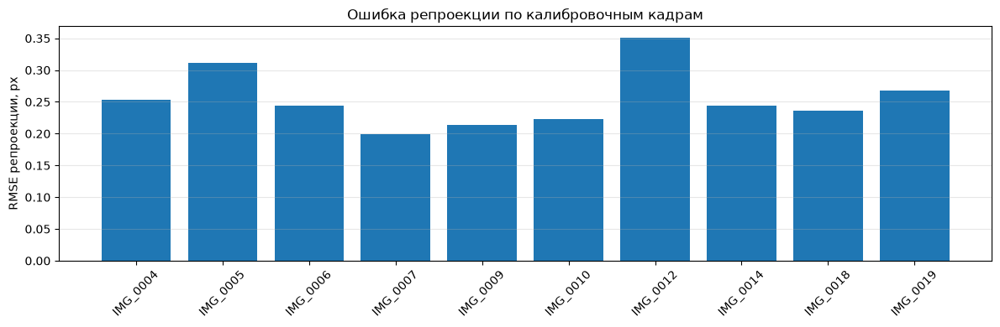

In [ ]:
per_view_rmse = []
projected_points = []
total_squared_error = 0.0
total_points = 0

for path, points_3d, observed, rvec, tvec in zip(
    accepted_paths,
    object_points,
    image_points,
    rvecs,
    tvecs,
):
    predicted, _ = cv2.projectPoints(
        points_3d,
        rvec,
        tvec,
        K,
        dist_coeffs,
    )

    residuals = (
        observed.reshape(-1, 2)
        - predicted.reshape(-1, 2)
    )

    squared_errors = np.sum(residuals**2, axis=1)
    frame_rmse = np.sqrt(np.mean(squared_errors))

    per_view_rmse.append(frame_rmse)
    projected_points.append(predicted)

    total_squared_error += squared_errors.sum()
    total_points += len(points_3d)

    print(f"{path.name}: RMSE = {frame_rmse:.4f} px")

overall_rmse = np.sqrt(total_squared_error / total_points)
print(f"\nОбщая RMSE по всем точкам: {overall_rmse:.4f} px")

fig, ax = plt.subplots(figsize=(12, 4))
ax.bar(
    [path.stem for path in accepted_paths],
    per_view_rmse,
)
ax.set_ylabel("RMSE репроекции, px")
ax.set_title("Ошибка репроекции по калибровочным кадрам")
ax.tick_params(axis="x", rotation=45)
ax.grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()

## 6. Тестирование

Хотим ответить на вопрос - могут ли найденные при калибровке $K$ и коэффициенты дисторсии объяснить расположение углов на новой фотографии?


Тестовый кадр: IMG_0008.JPG
RMSE: 0.2074 px
Средняя ошибка: 0.1775 px
Максимальная ошибка: 0.4854 px


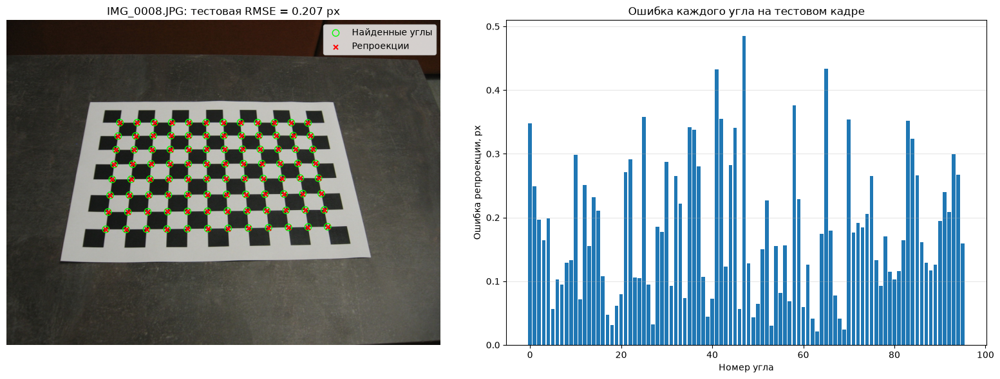

In [ ]:
test_paths = sorted(
    path
    for path in TEST_DIR.iterdir()
    if path.suffix.lower() in {".jpg", ".jpeg", ".png"}
)

if not test_paths:
    raise FileNotFoundError(f"В папке нет изображений: {TEST_DIR}")

for path in test_paths:
    image = cv2.imread(
        str(path),
        cv2.IMREAD_COLOR | cv2.IMREAD_IGNORE_ORIENTATION,
    )

    if image is None:
        print(f"[ОШИБКА ЧТЕНИЯ] {path.name}")
        continue

    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    if (gray.shape[1], gray.shape[0]) != image_size:
        raise ValueError(
            f"{path.name}: размер тестового изображения "
            "не совпадает с калибровочным."
        )

    found, corners = cv2.findChessboardCorners( # Находим углы
        gray,
        PATTERN_SIZE,
        flags,
    )

    if not found:
        print(f"[НЕ НАЙДЕНО] {path.name}")
        continue

    corners = cv2.cornerSubPix(  # Уточням углы
        gray,
        corners,
        winSize=(5, 5),
        zeroZone=(-1, -1),
        criteria=criteria,
    )

    # На новом кадре доска находится в другом положении.
    # R, t меняются, когда меняется положение или ориентация камеры относительно выбранной мировой системы координат,
    # K и dist_coeffs остаются полученными на калибровочных кадрах.
    success, test_rvec, test_tvec = cv2.solvePnP(
        object_points_template,
        corners,
        K,
        dist_coeffs,
        flags=cv2.SOLVEPNP_ITERATIVE,
    )

    if not success:
        print(f"[ОШИБКА ОЦЕНКИ ПОЗЫ] {path.name}")
        continue

    predicted, _ = cv2.projectPoints( # Вычисляем репроекции
        object_points_template,
        test_rvec,
        test_tvec,
        K,
        dist_coeffs,
    )

    observed_xy = corners.reshape(-1, 2)
    predicted_xy = predicted.reshape(-1, 2)

    # Сравниваем найденные углы и репроекции
    residuals = observed_xy - predicted_xy
    point_errors = np.linalg.norm(residuals, axis=1)

    test_rmse = np.sqrt(np.mean(point_errors**2))

    print(f"\nТестовый кадр: {path.name}")
    print(f"RMSE: {test_rmse:.4f} px")
    print(f"Средняя ошибка: {point_errors.mean():.4f} px")
    print(f"Максимальная ошибка: {point_errors.max():.4f} px")

    # Визуализация наблюдений, репроекций и ошибок.
    fig, axes = plt.subplots(1, 2, figsize=(16, 6))
    rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

    axes[0].imshow(rgb)
    axes[0].scatter(
        observed_xy[:, 0],
        observed_xy[:, 1],
        s=55,
        facecolors="none",
        edgecolors="lime",
        label="Найденные углы",
    )
    axes[0].scatter(
        predicted_xy[:, 0],
        predicted_xy[:, 1],
        s=25,
        marker="x",
        color="red",
        label="Репроекции",
    )
    axes[0].set_title(
        f"{path.name}: тестовая RMSE = {test_rmse:.3f} px"
    )
    axes[0].legend()
    axes[0].axis("off")

    axes[1].bar(np.arange(len(point_errors)), point_errors)
    axes[1].set_xlabel("Номер угла")
    axes[1].set_ylabel("Ошибка репроекции, px")
    axes[1].set_title("Ошибка каждого угла на тестовом кадре")
    axes[1].grid(axis="y", alpha=0.3)

    plt.tight_layout()
    plt.show()

# 6. Применение калибровки

**После калибровки мы получаем:**

- intrinsic matrix \(K\);
- коэффициенты дисторсии;
- при необходимости extrinsics \(R, t\).

**Где это используется:**

1. **Исправление дисторсии**
   - получение изображения, более близкого к идеальной pinhole-модели.

2. **Переход от пикселя к 3D-лучу**
   $$
   \begin{bmatrix}
   x\\
   y\\
   1
   \end{bmatrix}
   \propto
   K^{-1}
   \begin{bmatrix}
   u\\
   v\\
   1
   \end{bmatrix}
   $$
   Позволяет понять, в каком направлении из камеры находится объект.

3. **Stereo и triangulation**
   - восстановление 3D-точек по изображениям нескольких камер;
   - оценка глубины.

4. **Оценка положения камеры / объекта**
   - PnP (задача определения пространственного положения камеры относительно объекта, если известны 3D-координаты точек объекта и их 2D-проекции на изображении.)

5. **SLAM / Structure from Motion**
   - восстановление движения камеры;
   - построение 3D-карты сцены.

**Важно:**

Калибровка относится к конкретной оптической конфигурации камеры.

Изменение:
- zoom;
- объектива;
- иногда focus

может изменить $K$ и distortion, поэтому может потребоваться повторная калибровка.